In [1]:
#import statements

import os
import requests
import json
import pandas as pd
from dotenv import load_dotenv
import alpaca_trade_api as tradeapi
import matplotlib.pyplot as plt
from datetime import date
import numpy as np
import hvplot.pandas
from pathlib import Path
import panel as pn
from MCForecastTools import MCSimulation

%matplotlib inline

#used for date calculations when pulling from Alpaca API
from datetime import date
from datetime import timedelta
from datetime import datetime

import seaborn as sns

In [2]:
#Initiate Alpaca tradeapi.REST object

# Load the environment variables from the .env file
load_dotenv()

# Set the variables for the Alpaca API and secret keys
alpaca_api_key = os.getenv("ALPACA_API_KEY")
alpaca_secret_key = os.getenv("ALPACA_SECRET_KEY")

# Create the Alpaca tradeapi.REST object
alpaca = tradeapi.REST(
    alpaca_api_key,
    alpaca_secret_key,
    api_version="v2")

In [3]:
#Read in data from the dataframe

significant_event_df = pd.read_csv(Path('significant_event_data_updated.csv'), parse_dates = True, infer_datetime_format = True)
significant_event_df.head()

,Ticker,Company_Name,Date,Sector,Size,Reason for Departure,CEO tenure in years
0,EBAY,eBay,9/25/2019,online retail,large,Differences with investors/board,4.17
1,NKE,Nike,10/22/2019,athletic wear,large,Scandal(s),13.00
2,KHC,Kraft Heinz,4/22/2019,food,large,Poor performance,4.00
3,CL,Colgate-Palmolive,2/11/2019,health,large,Planned retirement,12.00
4,MCD,McDonalds,11/3/2019,food,large,Scandal(s),4.67


In [4]:
#Create lists of the data to easily access the information later, which will help with displaying the data

company_name = significant_event_df["Company_Name"].tolist()
significant_event_date = significant_event_df["Date"].tolist()
sector = significant_event_df["Sector"].tolist()
size = significant_event_df["Size"].tolist()
tickers = significant_event_df["Ticker"].tolist()

In [5]:
#collect tickers for Alpaca Trade API
tickers_to_query = tickers.copy()

#add tickers for benchmarking purposes
#tickers_to_query.append("SPY") #S&P 500 index
tickers_to_query.append("MSCI") #check benchmark for treasury bills

print(f"The following tickers will be queried from Alpaca's API: \n{tickers_to_query}")

The following tickers will be queried from Alpaca's API: 
['EBAY', 'NKE', 'KHC', 'CL', 'MCD', 'GOOG', 'GOOGL', 'WFC', 'UA', 'UAA', 'GPS', 'UAL', 'EXPE', 'BURL', 'WBD', 'TPR', 'OSTK', 'GES', 'APRN', 'RAD', 'BBBY', 'SCOR', 'MSCI']


In [6]:
# querying daily data
timeframe = "1Day"

# specifying date range to query 
start_date = pd.Timestamp("2015-12-01", tz="America/New_York").isoformat() #as far back as Alpaca can query as of 8/2/2022
end_date = pd.Timestamp("2022-07-28", tz="America/New_York").isoformat() 

In [7]:
# Use the Alpaca get_bars function to get current closing prices the portfolio
prices_df = alpaca.get_bars(
    tickers_to_query,
    timeframe,
    start=start_date,
    end=end_date
).df

In [8]:
#check to make sure data is importing correctly 
display("head")
display(prices_df.head())
display("tail")
display(prices_df.tail())

'head'

,open,high,low,close,volume,trade_count,vwap,symbol
timestamp,,,,,,,,
2017-06-29 04:00:00+00:00,10.00,11.00,10.00,10.00,41065132,111048,10.301103,APRN
2017-06-30 04:00:00+00:00,10.00,10.10,9.17,9.34,12405290,37249,9.601606,APRN
2017-07-03 04:00:00+00:00,9.50,9.67,8.88,9.67,4270843,12064,9.181918,APRN
2017-07-05 04:00:00+00:00,9.60,9.63,8.78,8.84,5104758,16474,9.039581,APRN
2017-07-06 04:00:00+00:00,8.83,8.84,7.95,8.06,12546889,37840,8.178162,APRN


'tail'

,open,high,low,close,volume,trade_count,vwap,symbol
timestamp,,,,,,,,
2022-07-22 04:00:00+00:00,43.23,43.53,42.69,43.17,15855663,95772,43.102401,WFC
2022-07-25 04:00:00+00:00,43.51,43.91,43.21,43.50,20204043,91954,43.532797,WFC
2022-07-26 04:00:00+00:00,43.19,43.68,42.81,42.90,15391112,96040,43.079349,WFC
2022-07-27 04:00:00+00:00,42.98,43.97,42.69,43.71,19228525,94113,43.411851,WFC
2022-07-28 04:00:00+00:00,43.66,43.83,42.71,43.32,14527314,94741,43.158138,WFC


In [9]:
#check to make sure Alpaca was able to query all of the data
prices_df_tickers = prices_df["symbol"].unique()

for item in tickers_to_query:
    if not (item in prices_df_tickers):
        print(f"{item} - Error querying data from Alpaca API")

In [10]:
#Generic plots for data exploration
significant_event = "CEO change"

#iterate over all of the tickers queried from Alpaca API, plotting basic information. i represents the index of the ticker in the list, with ticker_text specified early in the loop
for i in range(len(prices_df_tickers)):
    ticker_text = prices_df_tickers[i]
    
    #subset the dataframe to the specific ticker, for plotting
    plot_df = prices_df.loc[prices_df["symbol"] == prices_df_tickers[i] ]
    
    #plot_df = plot_df.reset_index()
    #plot_df["timestamp"] = pd.to_datetime(plot_df["timestamp"])
    
    #add additional description for the stock if the information is included in the main csv as well as the prices_df dataframe from Alpaca
    if (ticker_text in tickers):
        #print("true")
        csv_index_val = tickers.index(ticker_text)
        display(f"{company_name[csv_index_val]}, a {size[csv_index_val]} size company in the {sector[csv_index_val]} sector with ticker symbol {ticker_text}, experienced a {significant_event} announced to the public on {significant_event_date[csv_index_val]}.")
    else:
        display(f"Additionally including information for {ticker_text}, which is not included in csv input data but is additionally queried from Alpaca")
    
    #plot the data
    display(plot_df.hvplot.line(x = "timestamp", y = "close", title=f"Stock Performance of {prices_df_tickers[i]}", ylabel = "Closing Stock Price", xlabel = "Date"))

'Blue Apron, a small size company in the food/delivery sector with ticker symbol APRN, experienced a CEO change announced to the public on 4/2/2019.'

:Curve   [timestamp]   (close)

'Bed bath and beyond, a small size company in the home goods retail sector with ticker symbol BBBY, experienced a CEO change announced to the public on 5/13/2019.'

:Curve   [timestamp]   (close)

'Burlington Stores, a medium size company in the clothing retail sector with ticker symbol BURL, experienced a CEO change announced to the public on 4/25/2019.'

:Curve   [timestamp]   (close)

'Colgate-Palmolive, a large size company in the health sector with ticker symbol CL, experienced a CEO change announced to the public on 2/11/2019.'

:Curve   [timestamp]   (close)

'eBay, a large size company in the online retail sector with ticker symbol EBAY, experienced a CEO change announced to the public on 9/25/2019.'

:Curve   [timestamp]   (close)

'Expedia, a medium size company in the travel sector with ticker symbol EXPE, experienced a CEO change announced to the public on 12/4/2019.'

:Curve   [timestamp]   (close)

'Guess, a small size company in the clothing sector with ticker symbol GES, experienced a CEO change announced to the public on 1/28/2019.'

:Curve   [timestamp]   (close)

'Alphabet, a large size company in the tech sector with ticker symbol GOOGL, experienced a CEO change announced to the public on 2019/12/03.'

:Curve   [timestamp]   (close)

'Alphabet, a large size company in the tech sector with ticker symbol GOOG, experienced a CEO change announced to the public on 2019/12/03.'

:Curve   [timestamp]   (close)

'Gap, a medium size company in the clothing sector with ticker symbol GPS, experienced a CEO change announced to the public on 11/7/2019.'

:Curve   [timestamp]   (close)

'Kraft Heinz, a large size company in the food sector with ticker symbol KHC, experienced a CEO change announced to the public on 4/22/2019.'

:Curve   [timestamp]   (close)

'McDonalds, a large size company in the food sector with ticker symbol MCD, experienced a CEO change announced to the public on 11/3/2019.'

:Curve   [timestamp]   (close)

'Additionally including information for MSCI, which is not included in csv input data but is additionally queried from Alpaca'

:Curve   [timestamp]   (close)

'Nike, a large size company in the athletic wear sector with ticker symbol NKE, experienced a CEO change announced to the public on 10/22/2019.'

:Curve   [timestamp]   (close)

'Overstock, a small size company in the internet retail sector with ticker symbol OSTK, experienced a CEO change announced to the public on 8/12/2019.'

:Curve   [timestamp]   (close)

'Rite Aid, a small size company in the drugs sector with ticker symbol RAD, experienced a CEO change announced to the public on 3/12/2019.'

:Curve   [timestamp]   (close)

'Comscore, a small size company in the media data sector with ticker symbol SCOR, experienced a CEO change announced to the public on 3/31/2019.'

:Curve   [timestamp]   (close)

'Tapestry, a medium size company in the Fashion sector with ticker symbol TPR, experienced a CEO change announced to the public on 2019/09/04.'

:Curve   [timestamp]   (close)

'Under Armour, a medium size company in the athletic wear sector with ticker symbol UAA, experienced a CEO change announced to the public on 10/22/2019.'

:Curve   [timestamp]   (close)

'United Airlines, a medium size company in the transportation sector with ticker symbol UAL, experienced a CEO change announced to the public on 12/5/2019.'

:Curve   [timestamp]   (close)

'Under Armour, a medium size company in the athletic wear sector with ticker symbol UA, experienced a CEO change announced to the public on 10/22/2019.'

:Curve   [timestamp]   (close)

'Warner Bros Discovery, a medium size company in the Media sector with ticker symbol WBD, experienced a CEO change announced to the public on 3/18/2019.'

:Curve   [timestamp]   (close)

'Wells Fargo, a large size company in the banking sector with ticker symbol WFC, experienced a CEO change announced to the public on 2019/03/28.'

:Curve   [timestamp]   (close)

In [11]:
def sig_event_data_subsetting(n=7, equal_date_ranges = False): 
    #n = 7 means that 7 days pre and post "event" are subsetted from the prices_df dataframe
    #equal_date_ranges = True means that an adjustment is made so that the "pre" and "post" datasets all have dataframes of n rows
    #equal_date_ranges = False means thate the prices_df dataframe is subsetted with +/- n days, no adjustment is made for weekends/holidays/etc
    #additional_increment = 5 means that, if equal_date_ranges = True, only 5 additional days will be used to look back in the past. This is used to help prevent an infinite loop
    additional_increment = n 
    
    
    #listing is a list of all of the "pre" event and "post" event dataframes that are subsetted from prices_df
    listing = []
    
    #iterate through all of the tickers pulled from the Alpaca API
    for i in range(len(tickers)):       
        
        #specify variables for easier use in the code below
        plot_df = prices_df.loc[prices_df["symbol"] == tickers[i]]
        ticker_text = tickers[i]
        change_date = significant_event_date[i]

        #specify dates in iso format to subset the dataframe
        change_date = pd.Timestamp(change_date, tz="America/New_York").isoformat()
        pre_change_date = pd.to_datetime(change_date) + timedelta(days=n*-1)
        post_change_date = pd.to_datetime(change_date) + timedelta(days=n)
           
        #subset the dataframes by the dates
        pre_change_date_df = plot_df.loc[(plot_df.index >= pre_change_date) & (plot_df.index < change_date)].copy()
        post_change_date_df = plot_df.loc[(plot_df.index >= change_date) & (plot_df.index <= post_change_date)].copy()
    
        #if "equal date ranges" is set to True, ensure that the dataframes subsetted have equal numbers of trading days (equal to n) for easier comparison

        #...checking "pre" dataframes
        if ((equal_date_ranges == True) & (len(pre_change_date_df) < n)):
            #attempts counter is used to prevent infinite while loop
            attempts = 0
            while attempts < additional_increment:
                additional_days = n - len(pre_change_date_df) + attempts
                pre_change_date = pd.to_datetime(change_date) + timedelta(days=(n+additional_days)*-1)
                pre_change_date_df = plot_df.loc[(plot_df.index >= pre_change_date) & (plot_df.index < change_date)].copy()
                #exit loop if the length of the dataframe = n
                if len(pre_change_date_df) == n:
                    break
                attempts += 1
        
        #...check "post" dataframes
        if ((equal_date_ranges == True) & (len(post_change_date_df) < n)):
            #attempts counter is used to prevent infinite while loop, as above
            attempts = 0
            while attempts < additional_increment:
                additional_days = n - len(post_change_date_df) + attempts
                post_change_date = pd.to_datetime(change_date) + timedelta(days=(n+additional_days))
                post_change_date_df = plot_df.loc[(plot_df.index >= change_date) & (plot_df.index <= post_change_date)].copy()
                #exit loop if the length of the dataframe = n
                if len(post_change_date_df) == n:
                    break
                attempts += 1

        #Adding additional columns to the dataframes
        
        #...Ensuring the dataframe has information in it
        if len(pre_change_date_df) > 0:
            #...Adding additional columns
            pre_change_date_df["pre_or_post"] = "pre"
            #pre_change_date_df["days"] = n #TELL NOAH remove
            pre_change_date_df["day_num"] = 1
            pre_change_date_df["day_num"] = pre_change_date_df["day_num"].cumsum()
            pre_change_date_df["close_pct_change"] = pre_change_date_df["close"].pct_change() * 100
            pre_change_date_df.drop(columns = ["open", "high", "low", "volume", "trade_count", "vwap"], inplace = True)
            #...Appending to the list "listing"
            listing.append(pre_change_date_df)
    
        #...Ensuring the dataframe has information in it
        if len(post_change_date_df) > 0:
            post_change_date_df["pre_or_post"] = "post"    
            #post_change_date_df["days"] = n 
            post_change_date_df["day_num"] = 1
            post_change_date_df["day_num"] = post_change_date_df["day_num"].cumsum()
            post_change_date_df["close_pct_change"] = post_change_date_df["close"].pct_change() * 100
            post_change_date_df.drop(columns = ["open", "high", "low", "volume", "trade_count", "vwap"], inplace = True)
            #...Appending to the list "listing"
            listing.append(post_change_date_df)
            

    return pd.concat(listing)

---
---
# Numerical & Graphical Analysis
---
---

In [12]:
def display_full(x):
    pd.set_option('display.max_rows', len(x))
    display(x)
    pd.reset_option('display.max_rows')



---
## Performance Analysis for n(days pre/post CEO change)=7
---

### Daily Percent Changes

In [13]:
df_7 = sig_event_data_subsetting(n=7 , equal_date_ranges = True).copy().dropna()
display(df_7.head())

plot_pct_change_7 = (
    df_7.copy().hvplot(
                   kind        =  'line'                                      ,
        
                   x           =  'day_num'                                   ,
                   y           =  'close_pct_change'                          ,
                   xlabel      =  'Time before(pre) and after(post) CEO-Change Announcement (Days)' ,
                   ylabel      =  'Percent Change of Stock Price (%)'         ,
                    label      =  '% Change vs. Time'                         ,
                  
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                   groupby     =  'symbol'                                    ,
                   widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                )
                    )
plot_pct_change_7

,close,symbol,pre_or_post,day_num,close_pct_change
timestamp,,,,,
2019-09-17 04:00:00+00:00,40.53,EBAY,pre,2,0.570720
2019-09-18 04:00:00+00:00,40.36,EBAY,pre,3,-0.419442
2019-09-19 04:00:00+00:00,40.40,EBAY,pre,4,0.099108
2019-09-20 04:00:00+00:00,40.36,EBAY,pre,5,-0.099010
2019-09-23 04:00:00+00:00,40.24,EBAY,pre,6,-0.297324


Row
    [0] HoloViews(DynamicMap, widgets={'symbol': <class '...})
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='symbol', options=['EBAY', 'NKE', ...], value='EBAY', width=250)
        [1] VSpacer()

### Daily Returns Averaged

In [14]:
df_7['daily_returns'] = ((df_7.copy()['close_pct_change'])/100)

df_avg_daily_returns_7 = df_7.copy().groupby(['symbol','pre_or_post']).mean()[['daily_returns']].reset_index()#.sort_values(['daily_returns'])

display(df_avg_daily_returns_7.head(10))

plot_avg_daily_returns_7 = (
    df_avg_daily_returns_7.copy().hvplot(
                   kind        =  'bar'                                       ,
                   #stacked     =   True                                       ,
        
                   x           =  'symbol'                                    ,
                   y           =  'daily_returns'                             ,
                   xlabel      =  'Symbol'                                    ,
                   ylabel      =  'Average Daily Returns of Stock'            ,
                    label      =  'Average Daily Returns of Stocks at End of Certain 7-Day Long Time Periods' ,
        
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                  #groupby     =  'symbol'                                    ,
                  #widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                  rot = 30
                )
                    )
plot_avg_daily_returns_7

,symbol,pre_or_post,daily_returns
0,APRN,post,0.023753
1,APRN,pre,0.006903
2,BBBY,post,-0.003868
3,BBBY,pre,-0.004412
4,BURL,post,-0.003070
5,BURL,pre,0.017077
6,CL,post,0.001842
7,CL,pre,0.002606
8,EBAY,post,-0.005507
9,EBAY,pre,-0.003080


:Bars   [symbol,pre_or_post]   (daily_returns)

11/20 companies had a higher post average daily return than pre for n=7.

### Cumulative Returns

In [15]:
df_7['daily_returns_plus_1'] = (1 + ((df_7.copy()['close_pct_change'])/100))

df_7['cum_returns'] = df_7.copy().groupby(['symbol','pre_or_post']).cumprod()['daily_returns_plus_1']

display(df_7.head(8))

plot_cum_returns_7 = (
    df_7.copy().hvplot(
                   kind        =  'line'                                      ,
        
                   x           =  'day_num'                                   ,
                   y           =  'cum_returns'                               ,
                   xlabel      =  'Time before(pre) and after(post) CEO-Change Announcement (Days)' ,
                   ylabel      =  'Cumulative Return of Stock'                ,
                    label      =  'Cumulative Return vs. Time'                ,
        
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                   groupby     =  'symbol'                                    ,
                   widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                )
                    )
plot_cum_returns_7

,close,symbol,pre_or_post,day_num,close_pct_change,daily_returns,daily_returns_plus_1,cum_returns
timestamp,,,,,,,,
2019-09-17 04:00:00+00:00,40.530,EBAY,pre,2,0.570720,0.005707,1.005707,1.005707
2019-09-18 04:00:00+00:00,40.360,EBAY,pre,3,-0.419442,-0.004194,0.995806,1.001489
2019-09-19 04:00:00+00:00,40.400,EBAY,pre,4,0.099108,0.000991,1.000991,1.002481
2019-09-20 04:00:00+00:00,40.360,EBAY,pre,5,-0.099010,-0.000990,0.999010,1.001489
2019-09-23 04:00:00+00:00,40.240,EBAY,pre,6,-0.297324,-0.002973,0.997027,0.998511
2019-09-24 04:00:00+00:00,39.555,EBAY,pre,7,-1.702286,-0.017023,0.982977,0.981514
2019-09-26 04:00:00+00:00,38.925,EBAY,post,2,-0.802752,-0.008028,0.991972,0.991972
2019-09-27 04:00:00+00:00,38.370,EBAY,post,3,-1.425819,-0.014258,0.985742,0.977829


Row
    [0] HoloViews(DynamicMap, widgets={'symbol': <class '...})
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='symbol', options=['EBAY', 'NKE', ...], value='EBAY', width=250)
        [1] VSpacer()

### Cumulative Returns at End of Time Period

In [16]:
df_cum_end_7 = df_7.copy()[df_7.copy()['day_num']==7]

display(df_cum_end_7.head())

plot_cum_end_7 = (
    df_cum_end_7.copy().hvplot(
                   kind        =  'bar'                                       ,
                  #stacked     =   True                                       ,
        
                   x           =  'symbol'                                    ,
                   y           =  'cum_returns'                               ,
                   xlabel      =  'Cumulative Return of Stock' ,
                   ylabel      =  'Cumulative Return of Stock'                ,
                    label      =  'Cum. Return of Stocks at End of Certain 7-Day Long Time Periods' ,
        
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                  #groupby     =  'symbol'                                    ,
                  #widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                  rot = 30
                )
                    )
plot_cum_end_7


,close,symbol,pre_or_post,day_num,close_pct_change,daily_returns,daily_returns_plus_1,cum_returns
timestamp,,,,,,,,
2019-09-24 04:00:00+00:00,39.555,EBAY,pre,7,-1.702286,-0.017023,0.982977,0.981514
2019-10-03 04:00:00+00:00,37.950,EBAY,post,7,-0.576369,-0.005764,0.994236,0.967125
2019-10-21 04:00:00+00:00,96.220,NKE,pre,7,0.124870,0.001249,1.001249,1.024925
2019-10-30 04:00:00+00:00,90.190,NKE,post,7,1.019265,0.010193,1.010193,0.943410
2019-04-18 04:00:00+00:00,32.960,KHC,pre,7,0.212831,0.002128,1.002128,0.999394


:Bars   [symbol,pre_or_post]   (cum_returns)

11/20 companies had higher post cumulative than pre cumulative returns for n=7.

---
## Volatility/Risk for n(days)=7
---

### Standard deviation

In [17]:
df_std_7 = df_7.copy().groupby(['symbol','pre_or_post']).std()[['close_pct_change']]

display(df_std_7.head(10))

df_std_7.reset_index(inplace=True)
df_std_sorted_7 = df_std_7.copy().sort_values('close_pct_change')

display(df_std_sorted_7.head())

plot_std_7 = (
    df_std_sorted_7.copy().hvplot(
                   kind        =  'bar'                                       ,
                #stacked     =   True                                       ,
        
                   x           =  'symbol'                                    ,
                  #y           =  'STD'                                       ,
                   xlabel      =  'Ticker'                                    ,
                   ylabel      =  'Standard Deviation of Stock (%)'           ,
                    label      =  'STD during Certain Time Periods'           ,
        
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                  #groupby     =  'symbol'                                    ,
                   widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                   rot = 30
                )
                    )
plot_std_7

close_pct_change
symbol pre_or_post                  
APRN   post                 4.517268
       pre                  4.965345
BBBY   post                 1.893154
       pre                  1.993541
BURL   post                 1.148108
       pre                  3.847064
CL     post                 0.798933
       pre                  0.696391
EBAY   post                 1.087514
       pre                  0.766568

,symbol,pre_or_post,close_pct_change
21,KHC,pre,0.298805
25,NKE,pre,0.443351
7,CL,pre,0.696391
16,GOOGL,post,0.699471
14,GOOG,post,0.731464


HoloViews(Bars, widgets={'symbol': <class '...})

7/20 had higher post volatility than pre volatility for n=7.

### 7-Day-"ized" Standard Deviation

In [18]:
df_std_sorted_7['ized'] = (df_std_sorted_7.copy()['close_pct_change']) * (np.sqrt(7))
                            
display(df_std_sorted_7.head())

plot_stdi_7 = (
    df_std_sorted_7.copy().hvplot(
                   kind        =  'bar'                                       ,
                  #stacked     =   True                                       ,
        
                   x           =  'symbol'                                    ,
                   y           =  'ized'                                      ,
                   xlabel      =  'Ticker'                                    ,
                   ylabel      =  "7-Day-'ized' Standard Deviation of Stock (%)" ,
                    label      =  "'ized' STD during Certain Time Periods"    ,
        
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                  #groupby     =  'symbol'                                    ,
                   widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                   rot = 30
                )
                    )
plot_stdi_7

,symbol,pre_or_post,close_pct_change,ized
21,KHC,pre,0.298805,0.790564
25,NKE,pre,0.443351,1.172998
7,CL,pre,0.696391,1.842477
16,GOOGL,post,0.699471,1.850628
14,GOOG,post,0.731464,1.935272


HoloViews(Bars, widgets={'symbol': <class '...})

### Violin Plot of Percent Change for Pre CEO Change n=7

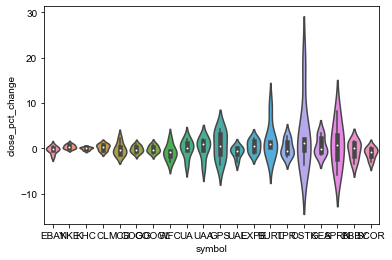

In [19]:
#If the voilin plots are not the correct size , re-run the cell

# df_7['daily_returns'] = ((df_7.copy()['close_pct_change'])/100)

# ax = sns.violinplot(x="symbol", y="daily_returns", data=df_7, scale = "width") #width = 100

# #https://stackoverflow.com/questions/31594549/how-to-change-the-figure-size-of-a-seaborn-axes-or-figure-level-plot
# sns.set(rc={'figure.figsize':(60,20)})

df_7_pre = df_7[df_7['pre_or_post']=='pre']
ax = sns.violinplot(x="symbol", y="close_pct_change", data=df_7_pre, scale = "width") #width = 100
sns.set(rc={'figure.figsize':(60,20)})
       



### Violin Plot of Percent Change for Post CEO Change n=7

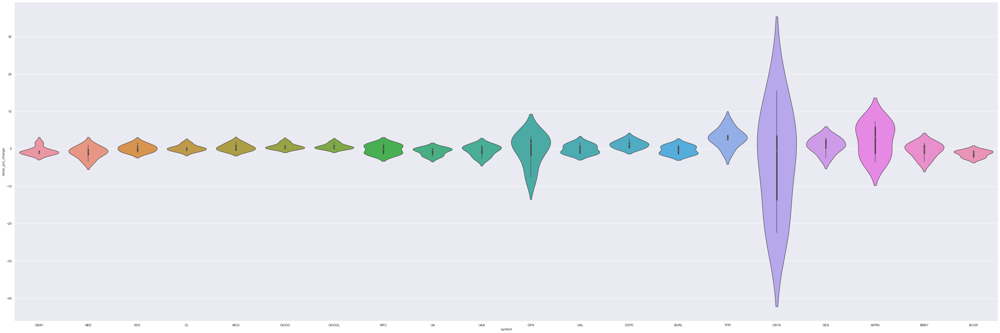

In [20]:

df_7_post = df_7[df_7['pre_or_post']=='post']
ax = sns.violinplot(x="symbol", y="close_pct_change", data=df_7_post, scale = "width") #width = 100
sns.set(rc={'figure.figsize':(60,20)})


Some companies' distributions were shifted upwards

---
## Risk return analysis for n=7
---

### Sharpe Ratios

In [21]:
#df_std_7['avg_daily_return'] =  df_7.copy().groupby(['symbol','pre_or_post']).mean()['daily_returns']

df_std_7['avg_daily_return'] = df_7.copy().groupby(['symbol','pre_or_post']).mean().reset_index()['daily_returns']

display(df_std_7.head(8))

df_std_7['sharpe_ratio'] = ( (df_std_7.copy()['avg_daily_return']*7)-(((7.56)/100)/108) ) / (df_std_7.copy()['close_pct_change'] * (np.sqrt(7)))#the T note is slightly off for the pre but it should be negligible

df_std_7.sort_values('sharpe_ratio',inplace=True)

display(df_std_7.head(8))

plot_sharpe_ratio_7 = (
    df_std_7.copy().hvplot(
                   kind        =  'bar'                                       ,
                  #stacked     =   True                                       ,
        
                   x           =  'symbol'                                    ,
                   y           =  'sharpe_ratio'                              ,
                   xlabel      =  'Ticker'                                    ,
                   ylabel      =  "7-Day-'ized' Standard Deviation of Stock (%)" ,
                    label      =  "Sharpe Ratio during Certain Time Periods"  ,
        
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                  #groupby     =  'symbol'                                    ,
                   widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                   rot = 30
                )
                    )
plot_sharpe_ratio_7


,symbol,pre_or_post,close_pct_change,avg_daily_return
0,APRN,post,4.517268,0.023753
1,APRN,pre,4.965345,0.006903
2,BBBY,post,1.893154,-0.003868
3,BBBY,pre,1.993541,-0.004412
4,BURL,post,1.148108,-0.003070
5,BURL,pre,3.847064,0.017077
6,CL,post,0.798933,0.001842
7,CL,pre,0.696391,0.002606


,symbol,pre_or_post,close_pct_change,avg_daily_return,sharpe_ratio
28,SCOR,post,0.884367,-0.013151,-0.039644
29,SCOR,pre,1.237561,-0.010328,-0.022294
32,UA,post,0.974896,-0.006947,-0.019124
37,UAL,pre,1.244846,-0.007929,-0.017064
24,NKE,post,1.516858,-0.009565,-0.016858
8,EBAY,post,1.087514,-0.005507,-0.013640
39,WFC,pre,1.697878,-0.008627,-0.013599
9,EBAY,pre,0.766568,-0.003080,-0.010977


HoloViews(Bars, widgets={'symbol': <class '...})

11/20 companies have a higher sharpe ratio post CEO change than pre CEO change.

---
## Performance Analysis for n(days pre/post CEO change)=64
---

### Daily Percent Changes

In [22]:
df_64 = sig_event_data_subsetting(n=64 , equal_date_ranges = True).copy().dropna()
display(df_64.head())

plot_pct_change_64 = (
    df_64.copy().hvplot(
                   kind        =  'line'                                      ,
        
                   x           =  'day_num'                                   ,
                   y           =  'close_pct_change'                          ,
                   xlabel      =  'Time before(pre) and after(post) CEO-Change Announcement (Days)' ,
                   ylabel      =  'Percent Change of Stock Price (%)'         ,
                    label      =  '% Change vs. Time'                         ,
                  
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                   groupby     =  'symbol'                                    ,
                   widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                )
                    )
plot_pct_change_64

,close,symbol,pre_or_post,day_num,close_pct_change
timestamp,,,,,
2019-06-26 04:00:00+00:00,39.20,EBAY,pre,2,0.461302
2019-06-27 04:00:00+00:00,39.29,EBAY,pre,3,0.229592
2019-06-28 04:00:00+00:00,39.50,EBAY,pre,4,0.534487
2019-07-01 04:00:00+00:00,39.89,EBAY,pre,5,0.987342
2019-07-02 04:00:00+00:00,40.08,EBAY,pre,6,0.476310


Row
    [0] HoloViews(DynamicMap, widgets={'symbol': <class '...})
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='symbol', options=['EBAY', 'NKE', ...], value='EBAY', width=250)
        [1] VSpacer()

### Daily Returns Averaged

In [23]:
df_64['daily_returns'] = ((df_64.copy()['close_pct_change'])/100)

df_avg_daily_returns_64 = df_64.copy().groupby(['symbol','pre_or_post']).mean()[['daily_returns']].reset_index()#.sort_values(['daily_returns'])

display(df_avg_daily_returns_64.head(10))

plot_avg_daily_returns_64 = (
    df_avg_daily_returns_64.copy().hvplot(
                   kind        =  'bar'                                       ,
                   #stacked     =   True                                       ,
        
                   x           =  'symbol'                                    ,
                   y           =  'daily_returns'                             ,
                   xlabel      =  'Symbol'                                    ,
                   ylabel      =  'Average Daily Returns of Stock'            ,
                    label      =  'Average Daily Returns of Stocks at End of Certain 64-Day Long Time Periods' ,
        
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                  #groupby     =  'symbol'                                    ,
                  #widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                  rot = 30
                )
                    )
plot_avg_daily_returns_64

,symbol,pre_or_post,daily_returns
0,APRN,post,0.209474
1,APRN,pre,0.000555
2,BBBY,post,-0.008878
3,BBBY,pre,0.000991
4,BURL,post,0.000508
5,BURL,pre,0.000990
6,CL,post,0.001374
7,CL,pre,0.001392
8,EBAY,post,-0.001165
9,EBAY,pre,0.000336


:Bars   [symbol,pre_or_post]   (daily_returns)

8/20 companies saw a increase average daily returns.

### Cumulative Returns

In [24]:
df_64['daily_returns_plus_1'] = (1 + ((df_64.copy()['close_pct_change'])/100))

df_64['cum_returns'] = df_64.copy().groupby(['symbol','pre_or_post']).cumprod()['daily_returns_plus_1']

display(df_64.head(8))

plot_cum_returns_64 = (
    df_64.copy().hvplot(
                   kind        =  'line'                                      ,
        
                   x           =  'day_num'                                   ,
                   y           =  'cum_returns'                               ,
                   xlabel      =  'Time before(pre) and after(post) CEO-Change Announcement (Days)' ,
                   ylabel      =  'Cumulative Return of Stock'                ,
                    label      =  'Cumulative Return vs. Time'                ,
        
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                   groupby     =  'symbol'                                    ,
                   widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                )
                    )
plot_cum_returns_64

,close,symbol,pre_or_post,day_num,close_pct_change,daily_returns,daily_returns_plus_1,cum_returns
timestamp,,,,,,,,
2019-06-26 04:00:00+00:00,39.20,EBAY,pre,2,0.461302,0.004613,1.004613,1.004613
2019-06-27 04:00:00+00:00,39.29,EBAY,pre,3,0.229592,0.002296,1.002296,1.006920
2019-06-28 04:00:00+00:00,39.50,EBAY,pre,4,0.534487,0.005345,1.005345,1.012301
2019-07-01 04:00:00+00:00,39.89,EBAY,pre,5,0.987342,0.009873,1.009873,1.022296
2019-07-02 04:00:00+00:00,40.08,EBAY,pre,6,0.476310,0.004763,1.004763,1.027166
2019-07-03 04:00:00+00:00,39.90,EBAY,pre,7,-0.449102,-0.004491,0.995509,1.022553
2019-07-05 04:00:00+00:00,39.80,EBAY,pre,8,-0.250627,-0.002506,0.997494,1.019990
2019-07-08 04:00:00+00:00,39.54,EBAY,pre,9,-0.653266,-0.006533,0.993467,1.013326


Row
    [0] HoloViews(DynamicMap, widgets={'symbol': <class '...})
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='symbol', options=['EBAY', 'NKE', ...], value='EBAY', width=250)
        [1] VSpacer()

---
## Volatility/Risk for n(days)=64
---

### Standard deviation

In [25]:
df_std_64 = df_64.copy().groupby(['symbol','pre_or_post']).std()[['close_pct_change']]

display(df_std_64.head(10))

df_std_64.reset_index(inplace=True)
df_std_sorted_64 = df_std_64.copy().sort_values('close_pct_change')

display(df_std_sorted_64.head())

plot_std_64 = (
    df_std_sorted_64.copy().hvplot(
                   kind        =  'bar'                                       ,
                   #stacked     =   True                                       ,
        
                   x           =  'symbol'                                    ,
                  #y           =  'STD'                                       ,
                   xlabel      =  'Ticker'                                    ,
                   ylabel      =  'Standard Deviation of Stock (%)'           ,
                    label      =  'STD during Certain Time Periods'           ,
        
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                  #groupby     =  'symbol'                                    ,
                   widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                   rot = 30
                )
                    )
plot_std_64

close_pct_change
symbol pre_or_post                  
APRN   post               174.950415
       pre                  7.679897
BBBY   post                 2.645841
       pre                  3.735495
BURL   post                 1.862150
       pre                  2.359371
CL     post                 0.893942
       pre                  1.330647
EBAY   post                 1.462575
       pre                  1.557235

,symbol,pre_or_post,close_pct_change
22,MCD,post,0.739827
6,CL,post,0.893942
24,NKE,post,0.960888
17,GOOGL,pre,1.027958
15,GOOG,pre,1.028661


HoloViews(Bars, widgets={'symbol': <class '...})

10/20 companies have highr post volatility than pre volatility for n=64.

### 64-Day-"ized" Standard Deviation

In [26]:
df_std_sorted_64['ized'] = (df_std_sorted_64.copy()['close_pct_change']) * (np.sqrt(64))
                            
display(df_std_sorted_64.head())

plot_stdi_64 = (
    df_std_sorted_64.copy().hvplot(
                   kind        =  'bar'                                       ,
                   #stacked     =   True                                       ,
        
                   x           =  'symbol'                                    ,
                   y           =  'ized'                                      ,
                   xlabel      =  'Ticker'                                    ,
                   ylabel      =  "64-Day-'ized' Standard Deviation of Stock (%)" ,
                    label      =  "'ized' STD during Certain Time Periods"    ,
        
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                  #groupby     =  'symbol'                                    ,
                   widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                   rot = 30
                )
                    )
plot_stdi_64

,symbol,pre_or_post,close_pct_change,ized
22,MCD,post,0.739827,5.918614
6,CL,post,0.893942,7.151533
24,NKE,post,0.960888,7.687103
17,GOOGL,pre,1.027958,8.223664
15,GOOG,pre,1.028661,8.229285


HoloViews(Bars, widgets={'symbol': <class '...})

### Violin Plot of Percent Change for Pre CEO Change n=64

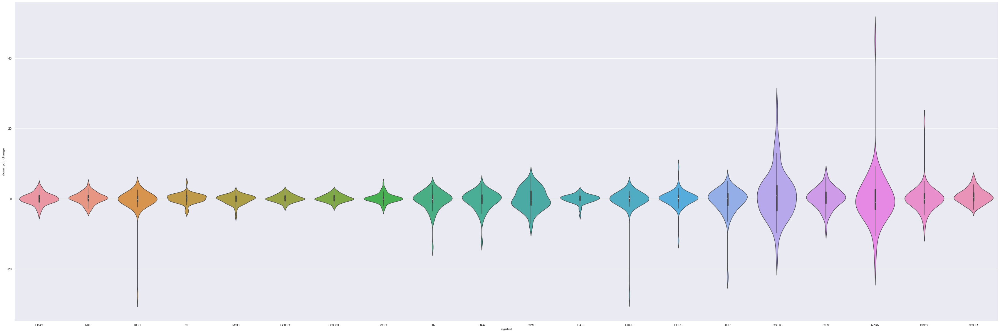

In [27]:
# df_64['daily_returns'] = ((df_64.copy()['close_pct_change'])/100)

# ax = sns.violinplot(x="symbol", y="daily_returns", data=df_64, scale = "width") #width = 100

# #https://stackoverflow.com/questions/31594549/how-to-change-the-figure-size-of-a-seaborn-axes-or-figure-level-plot
# sns.set(rc={'figure.figsize':(60,20)})

df_64_pre = df_64[df_64['pre_or_post']=='pre']
ax = sns.violinplot(x="symbol", y="close_pct_change", data=df_64_pre, scale = "width") #width = 100
sns.set(rc={'figure.figsize':(60,20)})

### Violin Plot of Percent Change for Post CEO Change n=64

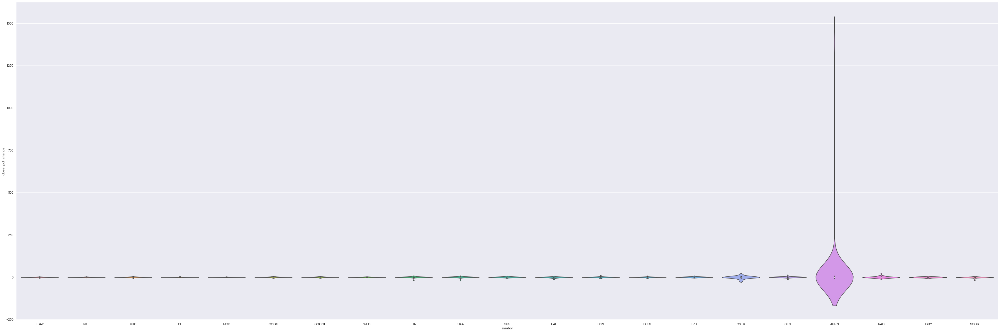

In [28]:
df_64_post = df_64[df_64['pre_or_post']=='post']
ax = sns.violinplot(x="symbol", y="close_pct_change", data=df_64_post, scale = "width") #width = 100
sns.set(rc={'figure.figsize':(60,20)})

---
## Risk return analysis for n(days)=64
---

In [29]:
#df_std_7['avg_daily_return'] =  df_7.copy().groupby(['symbol','pre_or_post']).mean()['daily_returns']

df_std_64['avg_daily_return'] = df_64.copy().groupby(['symbol','pre_or_post']).mean().reset_index()['daily_returns']

display(df_std_64.head(8))

df_std_64['sharpe_ratio'] = ( (df_std_64.copy()['avg_daily_return']*64)-(((7.56)/100)/11.8125) ) / (df_std_64.copy()['close_pct_change'] * (np.sqrt(64)))#the T note is slightly off for the pre but it should be negligible

df_std_64.sort_values('sharpe_ratio',inplace=True)

display(df_std_64.head(8))

plot_sharpe_ratio_64 = (
    df_std_7.copy().hvplot(
                   kind        =  'bar'                                       ,
                  #stacked     =   True                                       ,
        
                   x           =  'symbol'                                    ,
                   y           =  'sharpe_ratio'                              ,
                   xlabel      =  'Ticker'                                    ,
                   ylabel      =  "64-Day-'ized' Standard Deviation of Stock (%)" ,
                    label      =  "Sharpe Ratio during Certain Time Periods"  ,
        
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                  #groupby     =  'symbol'                                    ,
                   widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                   rot = 30
                )
                    )
plot_sharpe_ratio_64


,symbol,pre_or_post,close_pct_change,avg_daily_return
0,APRN,post,174.950415,0.209474
1,APRN,pre,7.679897,0.000555
2,BBBY,post,2.645841,-0.008878
3,BBBY,pre,3.735495,0.000991
4,BURL,post,1.862150,0.000508
5,BURL,pre,2.359371,0.000990
6,CL,post,0.893942,0.001374
7,CL,pre,1.330647,0.001392


,symbol,pre_or_post,close_pct_change,avg_daily_return,sharpe_ratio
29,SCOR,post,3.208029,-0.014785,-0.037119
2,BBBY,post,2.645841,-0.008878,-0.027145
37,UAL,post,3.014959,-0.009488,-0.025440
36,UAA,pre,2.669951,-0.004429,-0.013569
34,UA,pre,2.723288,-0.004131,-0.012429
32,TPR,pre,3.706664,-0.005353,-0.011769
26,OSTK,post,8.183865,-0.011406,-0.011248
21,KHC,pre,3.669125,-0.004847,-0.010786


HoloViews(Bars, widgets={'symbol': <class '...})

---
## Performance Analysis for n(days pre/post CEO change)=756
---

### Daily Percent Changes

In [30]:
df_756 = sig_event_data_subsetting(n=756 , equal_date_ranges = True).copy().dropna()
display(df_756.head())

plot_pct_change_756 = (
    df_756.copy().hvplot(
                   kind        =  'line'                                      ,
        
                   x           =  'day_num'                                   ,
                   y           =  'close_pct_change'                          ,
                   xlabel      =  'Time before(pre) and after(post) CEO-Change Announcement (Days)' ,
                   ylabel      =  'Percent Change of Stock Price (%)'         ,
                    label      =  '% Change vs. Time'                         ,
                  
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                   groupby     =  'symbol'                                    ,
                   widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                )
                    )
plot_pct_change_756

,close,symbol,pre_or_post,day_num,close_pct_change
timestamp,,,,,
2016-09-23 04:00:00+00:00,32.07,EBAY,pre,2,-0.650558
2016-09-26 04:00:00+00:00,31.67,EBAY,pre,3,-1.247272
2016-09-27 04:00:00+00:00,31.94,EBAY,pre,4,0.852542
2016-09-28 04:00:00+00:00,31.85,EBAY,pre,5,-0.281778
2016-09-29 04:00:00+00:00,32.30,EBAY,pre,6,1.412873


Row
    [0] HoloViews(DynamicMap, widgets={'symbol': <class '...})
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='symbol', options=['EBAY', 'NKE', ...], value='EBAY', width=250)
        [1] VSpacer()

### Cumulative Returns

In [31]:
df_756['daily_returns_plus_1'] = (1 + ((df_756.copy()['close_pct_change'])/100))

df_756['cum_returns'] = df_756.copy().groupby(['symbol','pre_or_post']).cumprod()['daily_returns_plus_1']

display(df_756.head(8))

plot_cum_returns_756 = (
    df_756.copy().hvplot(
                   kind        =  'line'                                      ,
        
                   x           =  'day_num'                                   ,
                   y           =  'cum_returns'                               ,
                   xlabel      =  'Time before(pre) and after(post) CEO-Change Announcement (Days)' ,
                   ylabel      =  'Cumulative Return of Stock'                ,
                    label      =  'Cumulative Return vs. Time'                ,
        
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                   groupby     =  'symbol'                                    ,
                   widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                )
                    )
plot_cum_returns_756

,close,symbol,pre_or_post,day_num,close_pct_change,daily_returns_plus_1,cum_returns
timestamp,,,,,,,
2016-09-23 04:00:00+00:00,32.07,EBAY,pre,2,-0.650558,0.993494,0.993494
2016-09-26 04:00:00+00:00,31.67,EBAY,pre,3,-1.247272,0.987527,0.981103
2016-09-27 04:00:00+00:00,31.94,EBAY,pre,4,0.852542,1.008525,0.989467
2016-09-28 04:00:00+00:00,31.85,EBAY,pre,5,-0.281778,0.997182,0.986679
2016-09-29 04:00:00+00:00,32.30,EBAY,pre,6,1.412873,1.014129,1.000620
2016-09-30 04:00:00+00:00,32.90,EBAY,pre,7,1.857585,1.018576,1.019207
2016-10-03 04:00:00+00:00,32.55,EBAY,pre,8,-1.063830,0.989362,1.008364
2016-10-04 04:00:00+00:00,32.56,EBAY,pre,9,0.030722,1.000307,1.008674


Row
    [0] HoloViews(DynamicMap, widgets={'symbol': <class '...})
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='symbol', options=['EBAY', 'NKE', ...], value='EBAY', width=250)
        [1] VSpacer()

---
## Volatility/Risk for n(days)=756
---

### Standard deviation

In [32]:
df_std_756 = df_756.copy().groupby(['symbol','pre_or_post']).std()[['close_pct_change']]

display(df_std_756.head(10))

df_std_756.reset_index(inplace=True)
df_std_sorted_756 = df_std_756.copy().sort_values('close_pct_change')

display(df_std_sorted_756.head())

plot_std_756 = (
    df_std_sorted_756.copy().hvplot(
                   kind        =  'bar'                                       ,
                   #stacked     =   True                                       ,
        
                   x           =  'symbol'                                    ,
                  #y           =  'STD'                                       ,
                   xlabel      =  'Ticker'                                    ,
                   ylabel      =  'Standard Deviation of Stock (%)'           ,
                    label      =  'STD during Certain Time Periods'           ,
        
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                  #groupby     =  'symbol'                                    ,
                   widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                   rot = 30
                )
                    )
plot_std_756

close_pct_change
symbol pre_or_post                  
APRN   post                51.322554
       pre                  5.761516
BBBY   post                 6.518674
       pre                  2.684284
BURL   post                 2.973360
       pre                  1.956437
CL     post                 1.409592
       pre                  1.073576
EBAY   post                 2.234857
       pre                  1.602577

,symbol,pre_or_post,close_pct_change
23,MCD,pre,1.045854
7,CL,pre,1.073576
41,WFC,pre,1.324098
6,CL,post,1.409592
17,GOOGL,pre,1.451770


HoloViews(Bars, widgets={'symbol': <class '...})

### 756-Day-"ized" Standard Deviation

In [33]:
df_std_sorted_756['ized'] = (df_std_sorted_756.copy()['close_pct_change']) * (np.sqrt(756))
                            
display(df_std_sorted_64.head())

plot_stdi_756 = (
    df_std_sorted_756.copy().hvplot(
                   kind        =  'bar'                                       ,
                  # stacked     =   True                                       ,
        
                   x           =  'symbol'                                    ,
                   y           =  'ized'                                      ,
                   xlabel      =  'Ticker'                                    ,
                   ylabel      =  "756-Day-'ized' Standard Deviation of Stock (%)" ,
                    label      =  "'ized' STD during Certain Time Periods"    ,
        
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                  #groupby     =  'symbol'                                    ,
                   widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                   rot = 30
                )
                    )
plot_stdi_756

,symbol,pre_or_post,close_pct_change,ized
22,MCD,post,0.739827,5.918614
6,CL,post,0.893942,7.151533
24,NKE,post,0.960888,7.687103
17,GOOGL,pre,1.027958,8.223664
15,GOOG,pre,1.028661,8.229285


HoloViews(Bars, widgets={'symbol': <class '...})

### Violin Plot of Percent Change for Pre CEO Change n=756

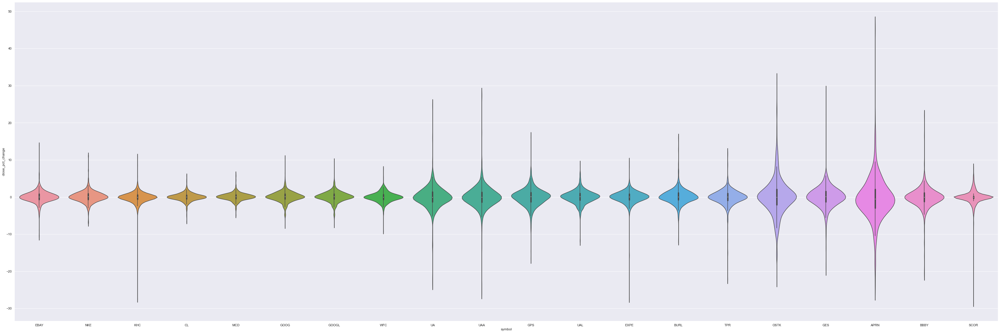

In [34]:
df_756_pre = df_756[df_756['pre_or_post']=='pre']
ax = sns.violinplot(x="symbol", y="close_pct_change", data=df_756_pre, scale = "width") #width = 100
sns.set(rc={'figure.figsize':(60,20)})

### Violin Plot of Percent Change for Post CEO Change n=756

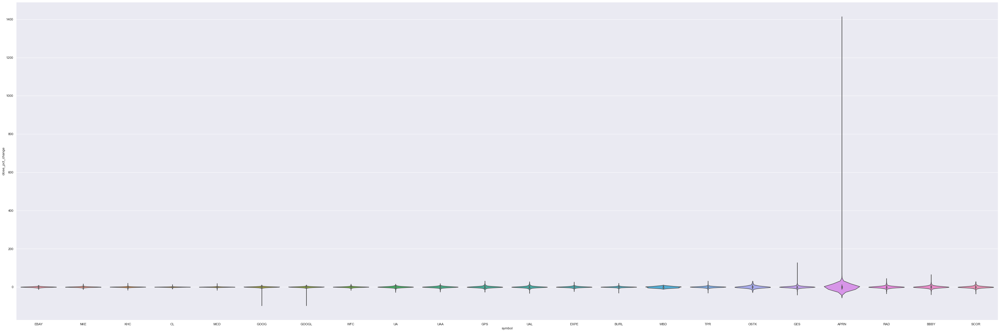

In [35]:
df_756_post = df_756[df_756['pre_or_post']=='post']
ax = sns.violinplot(x="symbol", y="close_pct_change", data=df_756_post, scale = "width") #width = 100
sns.set(rc={'figure.figsize':(60,20)})

---
## Risk return analysis for n(days)=756 
---

In [36]:
df_756['daily_returns'] = ((df_756.copy()['close_pct_change'])/100)

#df_std_7['avg_daily_return'] =  df_7.copy().groupby(['symbol','pre_or_post']).mean()['daily_returns']

df_std_756['avg_daily_return'] = df_756.copy().groupby(['symbol','pre_or_post']).mean().reset_index()['daily_returns']

display(df_std_756.head(8))

df_std_756['sharpe_ratio'] = ( (df_std_756.copy()['avg_daily_return']*756)-(((7.56)/100)) ) / (df_std_756.copy()['close_pct_change'] * (np.sqrt(756)))#the T note is slightly off for the pre but it should be negligible

df_std_756.sort_values('sharpe_ratio',inplace=True)

display(df_std_756.head(8))

plot_sharpe_ratio_756 = (
    df_std_7.copy().hvplot(
                   kind        =  'bar'                                       ,
                  #stacked     =   True                                       ,
        
                   x           =  'symbol'                                    ,
                   y           =  'sharpe_ratio'                              ,
                   xlabel      =  'Ticker'                                    ,
                   ylabel      =  "756-Day-'ized' Standard Deviation of Stock (%)" ,
                    label      =  "Sharpe Ratio during Certain Time Periods"  ,
        
                   by          =  'pre_or_post'                               ,
                   hover_color =  'yellow'                                    ,
                   
                  #groupby     =  'symbol'                                    ,
                   widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                   rot = 30
                )
                    )
plot_sharpe_ratio_756


,symbol,pre_or_post,close_pct_change,avg_daily_return
0,APRN,post,51.322554,0.020167
1,APRN,pre,5.761516,-0.003625
2,BBBY,post,6.518674,0.001513
3,BBBY,pre,2.684284,-0.001043
4,BURL,post,2.973360,0.000682
5,BURL,pre,1.956437,0.001677
6,CL,post,1.409592,0.000373
7,CL,pre,1.073576,0.000054


,symbol,pre_or_post,close_pct_change,avg_daily_return,sharpe_ratio
39,WBD,post,3.878993,-0.005462,-0.039428
21,KHC,pre,1.663493,-0.000996,-0.018114
1,APRN,pre,5.761516,-0.003625,-0.017778
3,BBBY,pre,2.684284,-0.001043,-0.011713
32,TPR,pre,2.138601,-0.000590,-0.008872
34,UA,pre,2.967164,-0.000557,-0.006085
30,SCOR,pre,2.046085,-0.000317,-0.005605
33,UA,post,3.570438,-0.000600,-0.005393


HoloViews(Bars, widgets={'symbol': <class '...})

# Closing Price Averages & Percent Change
 

In [37]:
df_avg = sig_event_data_subsetting(n=7, equal_date_ranges = True).copy().dropna()

df_avg_pre = df_avg.loc[df_avg["pre_or_post"] == 'pre']
df_avg_pre= df_avg_pre.groupby('symbol').mean().drop('day_num', axis=1)
df_avg_pre.insert(loc=0, column="pre_or_post", value=['pre','pre','pre','pre','pre','pre','pre','pre','pre','pre','pre','pre','pre','pre','pre','pre','pre','pre','pre','pre'])
display(df_avg_pre)

,pre_or_post,close,close_pct_change
symbol,,,
APRN,pre,0.956067,0.690290
BBBY,pre,16.038333,-0.441150
BURL,pre,164.390000,1.707658
CL,pre,65.175000,0.260597
EBAY,pre,40.240833,-0.308039
EXPE,pre,100.173333,0.479164
GES,pre,21.881667,0.593291
GOOG,pre,1303.908333,-0.144560
GOOGL,pre,1302.898333,-0.142587


In [38]:
#Creating a dataframe of the mean close prices for each stock for 7 days after the CEO change

df_avg_post= df_avg.loc[df_avg["pre_or_post"] == 'post']
df_avg_post= df_avg_post.groupby('symbol').mean().drop('day_num', axis=1)
#df_avg_post= df_avg_post.rename(columns = {'close':'post_close_mean', 'close_pct_change':'post_close_pct_change_mean'})
df_avg_post.insert(loc=0, column="pre_or_post", value=['post','post','post','post','post','post','post','post','post','post','post','post','post','post','post','post','post','post','post','post'])
display(df_avg_post)

,pre_or_post,close,close_pct_change
symbol,,,
APRN,post,1.090000,2.375330
BBBY,post,14.956667,-0.386794
BURL,post,171.208333,-0.306991
CL,post,66.186667,0.184218
EBAY,post,38.489167,-0.550664
EXPE,post,109.895000,1.220458
GES,post,19.520000,0.885079
GOOG,post,1337.088333,0.632215
GOOGL,post,1335.903333,0.629417


In [39]:
#Combining the pre and post dataframes and renaming the columns

frames = [df_avg_pre, df_avg_post]
df_pre_post_avg = pd.concat(frames,axis = 0,join = 'inner')
df_pre_post_avg =df_pre_post_avg.rename(columns = {'close':'7Day_close_mean', 'close_pct_change':'7Day_close_pct_change_mean'})
display(df_pre_post_avg)

,pre_or_post,7Day_close_mean,7Day_close_pct_change_mean
symbol,,,
APRN,pre,0.956067,0.690290
BBBY,pre,16.038333,-0.441150
BURL,pre,164.390000,1.707658
CL,pre,65.175000,0.260597
EBAY,pre,40.240833,-0.308039
EXPE,pre,100.173333,0.479164
GES,pre,21.881667,0.593291
GOOG,pre,1303.908333,-0.144560
GOOGL,pre,1302.898333,-0.142587


In [40]:
#Changing the index to make graphing easier
df_pre_post_avg.reset_index(inplace=True)
df_pre_post_avg = df_pre_post_avg.rename(columns = {'index':'symbols'})
df_pre_post_avg.set_index('pre_or_post')

,symbol,7Day_close_mean,7Day_close_pct_change_mean
pre_or_post,,,
pre,APRN,0.956067,0.690290
pre,BBBY,16.038333,-0.441150
pre,BURL,164.390000,1.707658
pre,CL,65.175000,0.260597
pre,EBAY,40.240833,-0.308039
pre,EXPE,100.173333,0.479164
pre,GES,21.881667,0.593291
pre,GOOG,1303.908333,-0.144560
pre,GOOGL,1302.898333,-0.142587


In [41]:
df_graph_pre_post_change_7 = (

df_pre_post_avg.hvplot(
                kind        =  'bar'                                       ,
        
                x           =  'pre_or_post'                                   ,
                y           =  '7Day_close_mean'                ,
                xlabel      =  'Pre and Post CEO Change' ,
                ylabel      =  '7 Day Average Stock Closing Price'         ,
                label      =  'Average Stock Closing Price For the 7 Days Preceding and 7 Days Post CEO Change'                         ,
        
                  
                #by          =  'pre_or_post'                               ,
                hover_color =  'yellow'                                    ,
                   
                groupby     =  'symbol'                                    ,
                widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                    )
                  )

df_graph_pre_post_change_7 

Row
    [0] HoloViews(DynamicMap, widgets={'symbol': <class '...})
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='symbol', options=['APRN', 'BBBY', ...], value='APRN', width=250)
        [1] VSpacer()

In [42]:
#Creating an interactive bar chart of the Average Stock Closing Price For the 7 Days Preceding and 7 Days Post CEO Change
df_graph_pct_change_7 = (

df_pre_post_avg.hvplot(
                kind        =  'bar'                                       ,
        
                x           =  'pre_or_post'                                   ,
                y           =  '7Day_close_pct_change_mean'                ,
                xlabel      =  'Pre and Post CEO Change' ,
                ylabel      =  'Average 7 Day Stock Closing Price Percent Change'         ,
                label      =  'Mean Pecent Change in Stock Closing Price For the 7 Days Pre and Post CEO Change'                         ,
        
                  
                #by          =  'pre_or_post'                               ,
                hover_color =  'yellow'                                    ,
                   
                groupby     =  'symbol'                                    ,
                widgets     = {'symbol' : pn.widgets.DiscreteSlider}       ,
                    )
                  )

df_graph_pct_change_7 

Row
    [0] HoloViews(DynamicMap, widgets={'symbol': <class '...})
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='symbol', options=['APRN', 'BBBY', ...], value='APRN', width=250)
        [1] VSpacer()

# Monte Carlo Analysis

Update the values in the code block below for addtional analysis. 

### To run additional cases, the user can specify the following in the blocks below:
Stock ticker (ticker_MC), the trading date you want to analyze with the Monte Carlo Simulation (comparison_date), the number of simulations you want the Monte Carlo to run (MC_num_sumulation), and the number of trading days in the historical dataset for the Monte Carlo simulation (MC_num_trading_days_hist)

The calculations use the MCForecastTools.py file for the analysis. See the last code blocks for significance statements. 25% - 75% percentiles are used in addition to 5% - 95% percentiles

In [43]:
#USER INPUT FOR MONTE CARLO ANALYSIS
ticker_MC = "EXPE"
comparison_date = "2019-12-04" #predicting this trading day (or if it's not trading day, day before) with MC model
MC_num_simulation = 100
MC_num_trading_days_hist = 30

In [44]:
#specify dataframes for Monte Carlo Simulation

#main df for Monte Carlo Simulation
MC_df_1 = prices_df[prices_df['symbol']==ticker_MC].drop('symbol', axis=1)
MC_df_1["daily_return"] = MC_df_1["close"].pct_change()
#second ticker isn't used in this example, but could be used for future analysis
MC_df_2 = prices_df[prices_df['symbol']==ticker_MC].drop('symbol', axis=1)
MC_df_2["daily_return"] = MC_df_2["close"].pct_change()

#update dataframe for Monte Carlo Simulation based on comparison_day
MC_date = pd.Timestamp(comparison_date, tz="America/New_York").isoformat()
MC_df_1 = MC_df_1.loc[(MC_df_1.index <= MC_date)]
MC_df_2 = MC_df_2.loc[(MC_df_2.index <= MC_date)]

#Check the tail of the dataframe to make sure the last row of the dataframe is the day you want to run Monte Carlo Simulations on
display(MC_df_1.tail())

#remove last trading day for Monte Carlo Simulation prediction purposes
MC_df_1_lastday_pctchange = MC_df_1.iloc[-1, 7]
MC_df_1_formodel = MC_df_1[0:len(MC_df_1)-1]
MC_df_2_lastday_pctchange = MC_df_2.iloc[-1, 7]
MC_df_2_formodel = MC_df_2[0:len(MC_df_2)-1]

MC_df_formodel = pd.concat([MC_df_1_formodel, MC_df_2_formodel], axis=1, keys=[ticker_MC, f"{ticker_MC}2"]) #being fed to simulation

,open,high,low,close,volume,trade_count,vwap,daily_return
timestamp,,,,,,,,
2019-11-27 05:00:00+00:00,99.50,102.15,99.30,101.51,2720945,29704,101.328187,0.022256
2019-11-29 05:00:00+00:00,101.92,102.87,101.38,101.66,1759797,21372,102.118582,0.001478
2019-12-02 05:00:00+00:00,101.53,101.66,99.88,100.75,2958267,30126,100.517927,-0.008951
2019-12-03 05:00:00+00:00,99.75,99.93,99.18,99.39,2368703,28537,99.481491,-0.013499
2019-12-04 05:00:00+00:00,106.10,109.32,102.60,105.56,16734607,148085,105.785041,0.062079


In [45]:
#perform Monte Carlo Simulation work

#slice the dataframe to account for the historical trading days of interest (MC_num_trading_days_hist)
MC_df_formodel = MC_df_formodel.tail(MC_num_trading_days_hist)

#Run MCSimulation
MC_df = MCSimulation(
    portfolio_data = MC_df_formodel,
    num_simulation = MC_num_simulation,
    weights = [1,0],
    num_trading_days = 1
)

print("calculating...")
MC_df.calc_cumulative_return()



calculating...
Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.


,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000
1,1.027901,0.952488,0.983177,0.986764,0.993844,1.037159,1.052202,0.943724,0.980334,0.964354,...,0.963054,1.068385,1.002971,0.957046,0.923532,0.99271,0.992643,1.062669,0.957904,0.990892


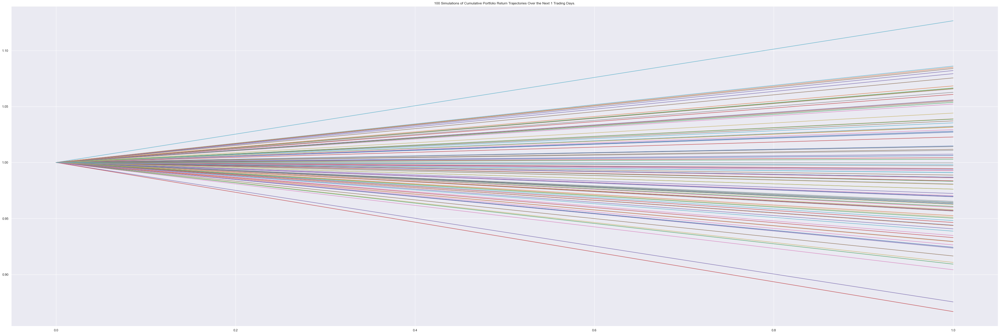

In [46]:
MC_df_line_plot = MC_df.plot_simulation()

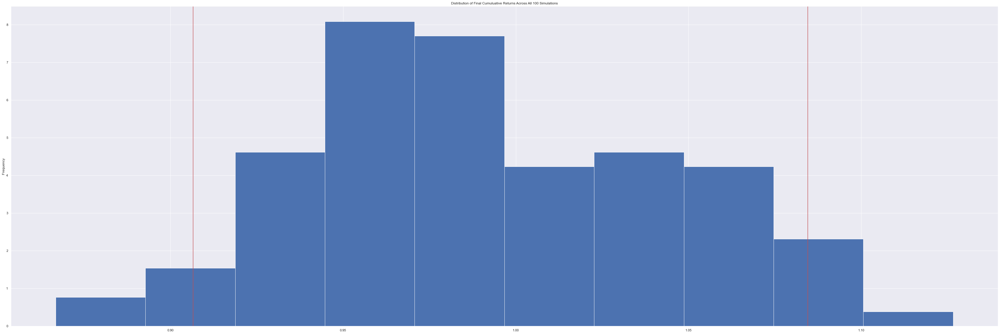

In [47]:
MC_df_hist_plot = MC_df.plot_distribution()

In [48]:
MC_df_table = MC_df.summarize_cumulative_return()

In [49]:
#calculate 95% confidence limits 
CI_lower = MC_df_table[8]
CI_upper = MC_df_table[9]

#calculate additional pctchange values for easy comparison
MC_df_1_lastday_pctchange_plus1 = MC_df_1_lastday_pctchange+1
MC_df_1_lastday_pctchange_pct = ((MC_df_1_lastday_pctchange+1)*100)-100

#print evaluation for 5% - 95% percentiles
print(f"95% confidence limits range from {CI_lower:.2f} to {CI_upper:.2f}")
if (MC_df_1_lastday_pctchange_plus1 > CI_upper) | (MC_df_1_lastday_pctchange_plus1 < CI_lower):
    print(f"Stock daily price change of {MC_df_1_lastday_pctchange_pct:0.2f}% on {comparison_date} is outside of the 95% confidence limits on Monte Carlo simulation using historical data going back {MC_num_trading_days_hist} trading days with {MC_num_simulation} simulations")
else:
    print(f"Stock daily price change of {MC_df_1_lastday_pctchange_pct:0.2f}% on {comparison_date} is inside of 95% confidence limits on Monte Carlo simulation using historical data going back {MC_num_trading_days_hist} trading days with {MC_num_simulation} simulations")

95% confidence limits range from 0.91 to 1.08
Stock daily price change of 6.21% on 2019-12-04 is inside of 95% confidence limits on Monte Carlo simulation using historical data going back 30 trading days with 100 simulations


In [50]:
#calculate percentiles for 25% and 75%
lower_25 = MC_df_table[4]
upper_25 = MC_df_table[6]

#calculate additional pctchange values for easy compariso
MC_df_1_lastday_pctchange_plus1 = MC_df_1_lastday_pctchange+1
MC_df_1_lastday_pctchange_pct = ((MC_df_1_lastday_pctchange+1)*100)-100

#print evaluation for 245% - 75% percentiles
print(f"25th - 75th percentiles range from from {lower_25:.2f} to {upper_25:.2f}")
if (MC_df_1_lastday_pctchange_plus1 > upper_25) | (MC_df_1_lastday_pctchange_plus1 < lower_25):
    print(f"Stock daily price change of {MC_df_1_lastday_pctchange_pct:0.2f}% on {comparison_date} is outside of the 25th - 75th percentiles on Monte Carlo simulation using historical data going back {MC_num_trading_days_hist} trading days with {MC_num_simulation} simulations")
else:
    print(f"Stock daily price change of {MC_df_1_lastday_pctchange_pct:0.2f}% on {comparison_date} is inside of the 25th - 75th percentiles on Monte Carlo simulation using historical data going back {MC_num_trading_days_hist} trading days with {MC_num_simulation} simulations")


25th - 75th percentiles range from from 0.96 to 1.03
Stock daily price change of 6.21% on 2019-12-04 is outside of the 25th - 75th percentiles on Monte Carlo simulation using historical data going back 30 trading days with 100 simulations
